In [4]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import alpaca_trade_api as tradeapi
%matplotlib inline

In [3]:
from dotenv import load_dotenv

In [4]:
import plotly.graph_objects as go

In [5]:
load_dotenv()

True

In [6]:
alpaca_api_key = os.getenv("ALPACA_API_KEY")
alpaca_secret_key = os.getenv("ALPACA_SECRET_KEY")

api = tradeapi.REST(alpaca_api_key, alpaca_secret_key, api_version='v2')

In [7]:
tickers_div = ["BMY", "MET", "IP", "UVV", "HDV"]
securities = pd.DataFrame()

timeframe = '1D'

start_date = pd.Timestamp("2019-02-15", tz="America/New_York").isoformat()
end_date = pd.Timestamp("2020-02-15", tz="America/New_York").isoformat()

df_div = api.get_barset(
    tickers_div,
    timeframe,
    limit=None,
    start=start_date,
    end=end_date,
    after=None,
    until=None,
    ).df
df_div = df_div.droplevel(axis=1, level=0)
df_div.drop(columns=['open', 'high', 'low', 'volume'], inplace=True)
df_div.columns=["BMY", "MET", "IP", "UVV", "HDV"]
df_div.index = df_div.index.date
df_div.dropna(inplace=True)
df_div.head()

,BMY,MET,IP,UVV,HDV
2019-02-15,51.66,90.99,47.065,44.820,57.31
2019-02-20,51.30,91.65,47.750,45.050,59.35
2019-02-21,50.15,91.51,46.750,44.760,59.68
2019-02-22,50.98,92.14,46.730,44.740,60.05
2019-02-25,50.67,92.19,47.580,45.255,60.02


In [8]:
df_div_dreturns = df_div.pct_change()

In [9]:
avg_daily_return_bmy = df_div_dreturns.mean()['BMY']
avg_daily_return_met = df_div_dreturns.mean()['MET']
avg_daily_return_ip = df_div_dreturns.mean()['IP']
avg_daily_return_uvv = df_div_dreturns.mean()['UVV']
avg_daily_return_hdv = df_div_dreturns.mean()['HDV']
###################################################
std_dev_daily_return_bmy = df_div_dreturns.std()['BMY']
std_dev_daily_return_met = df_div_dreturns.std()['MET']
std_dev_daily_return_ip = df_div_dreturns.std()['IP']
std_dev_daily_return_uvv = df_div_dreturns.std()['UVV']
std_dev_daily_return_hdv = df_div_dreturns.std()['HDV']

In [10]:
# Set number of simulations and trading days
div_num_simulations = 1000
div_num_trading_days = 107

# Set last closing prices of `JNJ` and `MU`
BMY_last_price = df_div['BMY'][-1]
MET_last_price = df_div['MET'][-1]
IP_last_price = df_div['IP'][-1]
UVV_last_price = df_div['UVV'][-1]
HDV_last_price = df_div['HDV'][-1]

# Initialize empty DataFrame to hold simulated prices for each simulation
div_simulated_price_df = pd.DataFrame()
div_portfolio_cumulative_returns = pd.DataFrame()

# Run the simulation of projecting stock prices for the next trading year, `1000` times
for n in range(div_num_simulations):

    # Initialize the simulated prices list with the last closing price of `JNJ` and `MU`
    simulated_bmy_prices = [BMY_last_price]
    simulated_met_prices = [MET_last_price]
    simulated_ip_prices = [IP_last_price]
    simulated_uvv_prices = [UVV_last_price]
    simulated_hdv_prices = [HDV_last_price]
    
    # Simulate the returns for 252 days
    for i in range(div_num_trading_days):
        
        # Calculate the simulated price using the last price within the list
        simulated_bmy_price = simulated_bmy_prices[-1] * (1 + np.random.normal(avg_daily_return_bmy, std_dev_daily_return_bmy))
        simulated_met_price = simulated_met_prices[-1] * (1 + np.random.normal(avg_daily_return_met, std_dev_daily_return_met))
        simulated_ip_price = simulated_ip_prices[-1] * (1 + np.random.normal(avg_daily_return_ip, std_dev_daily_return_ip))
        simulated_uvv_price = simulated_uvv_prices[-1] * (1 + np.random.normal(avg_daily_return_uvv, std_dev_daily_return_uvv))
        simulated_hdv_price = simulated_hdv_prices[-1] * (1 + np.random.normal(avg_daily_return_hdv, std_dev_daily_return_hdv))
        # Append the simulated price to the list
        simulated_bmy_prices.append(simulated_bmy_price)
        simulated_met_prices.append(simulated_met_price)
        simulated_ip_prices.append(simulated_ip_price)
        simulated_uvv_prices.append(simulated_uvv_price)
        simulated_hdv_prices.append(simulated_hdv_price)
    # Append the simulated prices of each simulation to DataFrame
    div_simulated_price_df["BMY prices"] = pd.Series(simulated_bmy_prices)
    div_simulated_price_df["MET prices"] = pd.Series(simulated_met_prices)
    div_simulated_price_df["IP prices"] = pd.Series(simulated_ip_prices)
    div_simulated_price_df["UVV prices"] = pd.Series(simulated_uvv_prices)
    div_simulated_price_df["HDV prices"] = pd.Series(simulated_hdv_prices)
    
    # Calculate the daily returns of simulated prices
    div_simulated_daily_returns = div_simulated_price_df.pct_change()
    
    # Set the portfolio weights (60% JNJ; 40% MU)
    div_weights = [0.2,0.2,0.2,0.2,0.2]

    # Use the `dot` function with the weights to multiply weights with each column's simulated daily returns
    div_portfolio_daily_returns = div_simulated_daily_returns.dot(div_weights)
    
    # Calculate the normalized, cumulative return series
    div_portfolio_cumulative_returns[n] = (1 + div_portfolio_daily_returns.fillna(0)).cumprod()

# Print records from the DataFrame
div_portfolio_cumulative_returns.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.996005,0.998530,0.993774,0.997853,0.999950,0.999556,0.992388,0.984647,1.004655,0.997789,...,1.008031,1.002074,0.994829,1.007695,0.996668,0.997248,0.997921,0.987741,0.996849,1.001011
2,0.988698,1.003648,0.987419,1.000312,0.992690,1.005882,0.990423,0.988924,1.017017,0.997782,...,1.000714,1.003810,0.997146,1.005151,0.997111,0.995606,0.993616,0.989446,1.007669,0.993657
3,0.988669,0.997213,0.998033,0.997295,0.996932,1.002959,0.994991,0.987647,1.017148,0.996028,...,0.994613,1.010953,0.989210,1.013412,1.002183,0.999353,0.993047,0.991761,1.011240,0.994042
4,0.985963,0.997484,1.006394,0.999240,1.002238,0.994176,0.999001,0.991588,1.021900,0.984342,...,0.996460,1.005790,0.982599,1.013939,0.996757,1.001447,0.989978,0.992285,1.014177,0.994148


In [86]:
div_portfolio_cumulative_returns.to_csv('../Project 1/div_mt_returns.csv', index = False)

In [11]:
import panel as pn 
from panel.interact import interact 
from panel import widgets 

In [12]:
import plotly.express as px

In [13]:
pn.extension("plotly")

In [14]:
import hvplot.pandas

In [15]:
tickers_em = ['IEMG','VWO','EWZ','MCHI','INDA']
securities = pd.DataFrame()

timeframe = '1D'

start_date = pd.Timestamp("2019-02-15", tz="America/New_York").isoformat()
end_date = pd.Timestamp("2020-02-15", tz="America/New_York").isoformat()

df_em = api.get_barset(
    tickers_em,
    timeframe,
    limit=None,
    start=start_date,
    end=end_date,
    after=None,
    until=None,
    ).df
df_em = df_em.droplevel(axis=1, level=0)
df_em.drop(columns=['open', 'high', 'low', 'volume'], inplace=True)
df_em.columns=["IEMG", "VWO", "EWZ", "MCHI", "INDA"]
df_em.index = df_em.index.date
df_em.dropna(inplace=True)
df_em.head()

,IEMG,VWO,EWZ,MCHI,INDA
2019-02-15,44.41,50.5799,31.9099,58.74,40.810
2019-02-20,43.75,51.3200,32.0700,59.89,41.470
2019-02-21,43.55,51.1900,32.1600,59.77,41.380
2019-02-22,44.15,51.7700,32.4400,60.91,41.860
2019-02-25,43.92,52.2900,32.8200,62.08,42.405


In [16]:
df_em_dreturns = df_em.pct_change()
avg_daily_return_iemg = df_em_dreturns.mean()['IEMG']
avg_daily_return_vwo = df_em_dreturns.mean()['VWO']
avg_daily_return_ewz = df_em_dreturns.mean()['EWZ']
avg_daily_return_mchi = df_em_dreturns.mean()['MCHI']
avg_daily_return_inda = df_em_dreturns.mean()['INDA']
###################################################
std_dev_daily_return_iemg = df_em_dreturns.std()['IEMG']
std_dev_daily_return_vwo = df_em_dreturns.std()['VWO']
std_dev_daily_return_ewz = df_em_dreturns.std()['EWZ']
std_dev_daily_return_mchi = df_em_dreturns.std()['MCHI']
std_dev_daily_return_inda = df_em_dreturns.std()['INDA']

In [17]:
em_num_simulations = 1000
em_num_trading_days = 107

# Set last closing prices of `JNJ` and `MU`
IEMG_last_price = df_em['IEMG'][-1]
VWO_last_price = df_em['VWO'][-1]
EWZ_last_price = df_em['EWZ'][-1]
MCHI_last_price = df_em['MCHI'][-1]
INDA_last_price = df_em['INDA'][-1]

# Initialize empty DataFrame to hold simulated prices for each simulation
em_simulated_price_df = pd.DataFrame()
em_portfolio_cumulative_returns = pd.DataFrame()

# Run the simulation of projecting stock prices for the next trading year, `1000` times
for n in range(em_num_simulations):

    # Initialize the simulated prices list with the last closing price of `JNJ` and `MU`
    simulated_iemg_prices = [IEMG_last_price]
    simulated_vwo_prices = [VWO_last_price]
    simulated_ewz_prices = [EWZ_last_price]
    simulated_mchi_prices = [MCHI_last_price]
    simulated_inda_prices = [INDA_last_price]
    
    # Simulate the returns for 252 days
    for i in range(em_num_trading_days):
        
        # Calculate the simulated price using the last price within the list
        simulated_iemg_price = simulated_iemg_prices[-1] * (1 + np.random.normal(avg_daily_return_iemg, std_dev_daily_return_iemg))
        simulated_vwo_price = simulated_vwo_prices[-1] * (1 + np.random.normal(avg_daily_return_vwo, std_dev_daily_return_vwo))
        simulated_ewz_price = simulated_ewz_prices[-1] * (1 + np.random.normal(avg_daily_return_ewz, std_dev_daily_return_ewz))
        simulated_mchi_price = simulated_mchi_prices[-1] * (1 + np.random.normal(avg_daily_return_mchi, std_dev_daily_return_mchi))
        simulated_inda_price = simulated_inda_prices[-1] * (1 + np.random.normal(avg_daily_return_inda, std_dev_daily_return_inda))
        # Append the simulated price to the list
        simulated_iemg_prices.append(simulated_iemg_price)
        simulated_vwo_prices.append(simulated_vwo_price)
        simulated_ewz_prices.append(simulated_ewz_price)
        simulated_mchi_prices.append(simulated_mchi_price)
        simulated_inda_prices.append(simulated_inda_price)
    # Append the simulated prices of each simulation to DataFrame
    em_simulated_price_df["IEMG prices"] = pd.Series(simulated_iemg_prices)
    em_simulated_price_df["VWO prices"] = pd.Series(simulated_vwo_prices)
    em_simulated_price_df["EWZ prices"] = pd.Series(simulated_ewz_prices)
    em_simulated_price_df["MCHI prices"] = pd.Series(simulated_mchi_prices)
    em_simulated_price_df["INDA prices"] = pd.Series(simulated_inda_prices)
    
    # Calculate the daily returns of simulated prices
    em_simulated_daily_returns = em_simulated_price_df.pct_change()
    
    # Set the portfolio weights (60% JNJ; 40% MU)
    em_weights = [0.2,0.2,0.2,0.2,0.2]

    # Use the `dot` function with the weights to multiply weights with each column's simulated daily returns
    em_portfolio_daily_returns = em_simulated_daily_returns.dot(em_weights)
    
    # Calculate the normalized, cumulative return series
    em_portfolio_cumulative_returns[n] = (1 + em_portfolio_daily_returns.fillna(0)).cumprod()

# Print records from the DataFrame
em_portfolio_cumulative_returns.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.994544,0.995920,1.001746,0.996682,0.996227,0.998256,1.008145,0.999038,0.996973,0.992135,...,1.002423,0.995340,0.999430,1.009538,1.002339,0.997803,0.998492,0.999430,1.002926,1.001478
2,0.990057,0.993580,1.009902,0.994555,1.000137,0.993203,1.010622,0.995476,0.994742,1.000184,...,0.998574,0.995013,1.000456,1.012454,1.006066,1.001887,0.997131,0.999514,1.004335,0.996242
3,0.990115,0.990027,1.013875,0.997656,0.996804,0.988297,1.010765,0.987208,0.986718,0.997187,...,1.001474,1.001307,0.992036,1.014827,1.006074,0.993379,1.001868,0.991652,0.998121,0.991343
4,0.990371,0.989277,1.020004,1.010155,0.980290,0.986847,1.005719,0.998441,0.978599,1.008419,...,1.003891,0.997523,0.987141,1.012274,0.996031,0.986727,1.005565,0.985943,0.996317,0.990446


In [18]:
em_portfolio_cumulative_returns.to_csv('../Project 1/em_mt_returns.csv', index = False)

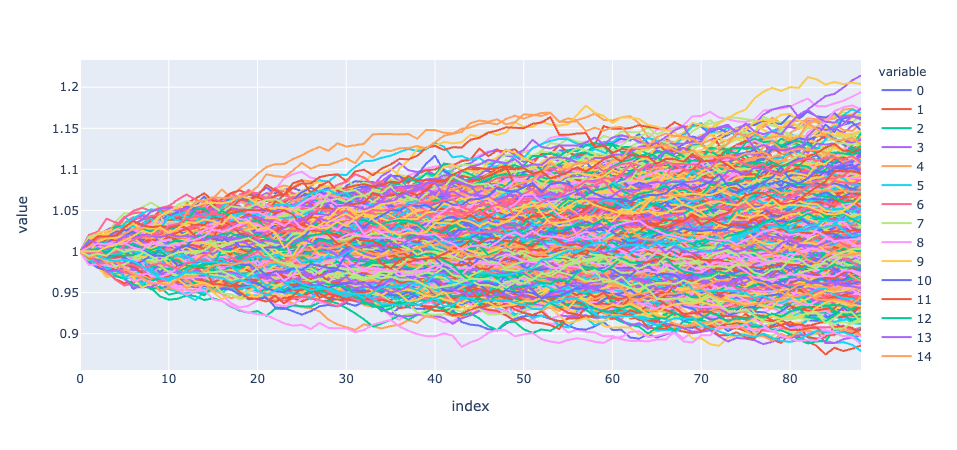

In [54]:
px.line(em_portfolio_cumulative_returns)

In [3]:
################ REAL HISTORICAL 
tickers_div = ["BMY", "MET", "IP", "UVV", "HDV"]

timeframe = '1D'

start_date = pd.Timestamp("2020-02-15", tz="America/New_York").isoformat()
end_date = pd.Timestamp("2020-08-07", tz="America/New_York").isoformat()

df_div_r = api.get_barset(
    tickers_div,
    timeframe,
    limit=None,
    start=start_date,
    end=end_date,
    after=None,
    until=None,
    ).df
df_div_r = df_div_r.droplevel(axis=1, level=0)
df_div_r.drop(columns=['open', 'high', 'low', 'volume'], inplace=True)
df_div_r.columns=["BMY", "MET", "IP", "UVV", "HDV"]
df_div_r.index = df_div_r.index.date
df_div_r.dropna(inplace=True)
df_div_r.head()

NameError: name 'pd' is not defined

In [20]:
df_div_r_returns = df_div_r.pct_change()
df_div_r_returns.head()

,BMY,MET,IP,UVV,HDV
2020-02-18,NaN,NaN,NaN,NaN,NaN
2020-02-19,-0.005599,0.003354,-0.012488,-0.000772,-0.007606
2020-02-20,-0.008218,-0.000836,0.005855,0.009461,0.009278
2020-02-21,0.007058,-0.003241,0.007218,-0.019893,0.015987
2020-02-24,-0.025446,-0.025907,-0.044383,-0.036300,-0.016916


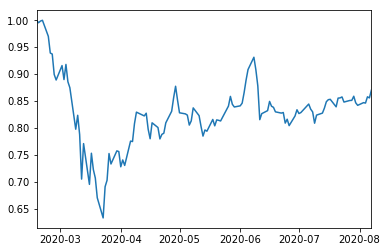

In [21]:
div_r_portfolio_cumulative_returns = pd.DataFrame
    
    # Set the portfolio weights (60% JNJ; 40% MU)
div_r_weights = [0.2,0.2,0.2,0.2,0.2]

    # Use the `dot` function with the weights to multiply weights with each column's simulated daily returns
df_div_r_portfolio = df_div_r_returns.dot(div_r_weights)
    
    # Calculate the normalized, cumulative return series
div_r_portfolio_cumulative_returns = (1 + df_div_r_portfolio.fillna(0)).cumprod()

# Print records from the DataFrame
div_r_portfolio_cumulative_returns.plot()

In [39]:
div_r_portfolio_cumulative_returns.to_csv('../Project 1/div_actual_returns.csv', index = False,header=True)

In [23]:
tickers_em = ['IEMG','VWO','EWZ','MCHI','INDA']

timeframe = '1D'

start_date = pd.Timestamp("2020-02-15", tz="America/New_York").isoformat()
end_date = pd.Timestamp("2020-08-07", tz="America/New_York").isoformat()

df_em_r = api.get_barset(
    tickers_em,
    timeframe,
    limit=None,
    start=start_date,
    end=end_date,
    after=None,
    until=None,
    ).df
df_em_r = df_em_r.droplevel(axis=1, level=0)
df_em_r.drop(columns=['open', 'high', 'low', 'volume'], inplace=True)
df_em_r.columns=['IEMG','VWO','EWZ','MCHI','INDA']
df_em_r.index = df_em_r.index.date
df_em_r.dropna(inplace=True)
df_em_r.head()

,IEMG,VWO,EWZ,MCHI,INDA
2020-02-18,43.34,52.625,34.900,64.82,43.59
2020-02-19,43.91,53.000,35.290,65.32,43.97
2020-02-20,42.86,52.190,34.895,64.57,43.37
2020-02-21,42.47,51.925,34.830,64.30,43.21
2020-02-24,40.36,49.960,33.880,62.17,41.69


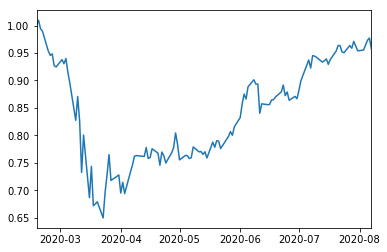

In [24]:
df_em_r_returns = df_em_r.pct_change()
em_r_portfolio_cumulative_returns = pd.DataFrame
    
    # Set the portfolio weights (60% JNJ; 40% MU)
em_r_weights = [0.2,0.2,0.2,0.2,0.2]

    # Use the `dot` function with the weights to multiply weights with each column's simulated daily returns
df_em_r_portfolio = df_em_r_returns.dot(em_r_weights)
    
    # Calculate the normalized, cumulative return series
em_r_portfolio_cumulative_returns = (1 + df_em_r_portfolio.fillna(0)).cumprod()

# Print records from the DataFrame
em_r_portfolio_cumulative_returns.plot()

In [38]:
em_r_portfolio_cumulative_returns.to_csv('../Project 1/em_actual_returns.csv', index = False,header=True)

In [23]:
div_r_portfolio_cumulative_returns = pd.DataFrame(div_r_portfolio_cumulative_returns,columns=['1000'])

In [25]:
alt_div_r_portfolio_cumulative_returns = div_r_portfolio_cumulative_returns.reset_index()
alt_div_r_portfolio_cumulative_returns.drop(columns=['index'],inplace=True)
alt_div_r_portfolio_cumulative_returns.head()

,1000
0,1.000000
1,0.995378
2,0.998471
3,0.999895
4,0.970108


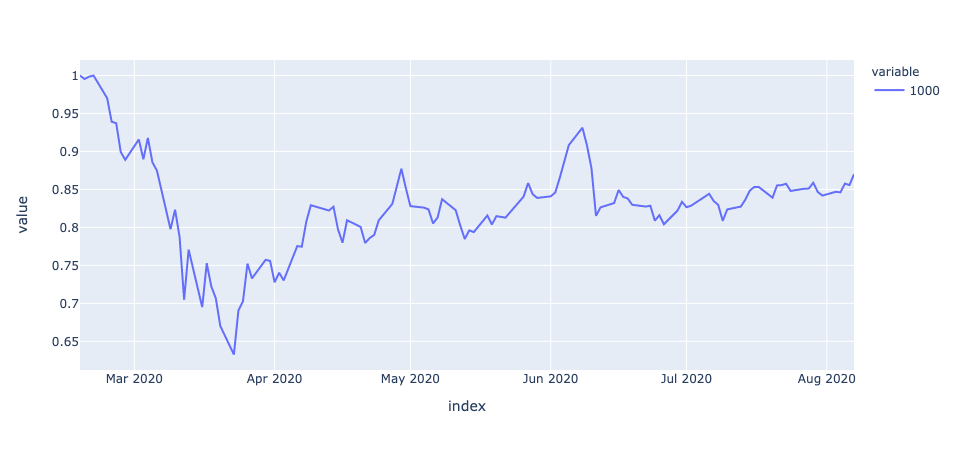

In [96]:
px.line(div_r_portfolio_cumulative_returns)

In [26]:
combined_div = pd.concat([div_portfolio_cumulative_returns, alt_div_r_portfolio_cumulative_returns],axis='columns',join='inner')

In [27]:
combined_div.tail()

,0,1,2,3,4,5,6,7,8,9,...,991,992,993,994,995,996,997,998,999,1000
84,1.002737,0.991188,1.023041,1.002467,1.035508,1.042261,1.012117,1.026917,1.090102,0.990090,...,0.968484,0.964301,0.956281,1.056155,0.930642,0.992352,1.041350,0.970125,0.967253,0.840228
85,1.005921,0.990452,1.019619,1.000150,1.037465,1.050053,1.010265,1.024076,1.082162,0.999896,...,0.972141,0.961420,0.948476,1.065541,0.923508,0.993151,1.045404,0.980389,0.971417,0.838131
86,1.005098,0.989731,1.020062,0.999363,1.029026,1.058498,1.019074,1.016229,1.069595,1.007139,...,0.964241,0.965579,0.945044,1.066297,0.925451,0.986780,1.036439,0.976393,0.961725,0.829773
87,1.011033,0.983170,1.018456,1.004347,1.021519,1.060223,1.020212,1.020626,1.062351,1.012332,...,0.965613,0.962550,0.942622,1.078496,0.926578,0.974343,1.044078,0.983447,0.956619,0.827448
88,1.010477,1.001093,1.023477,0.999673,1.015582,1.046327,1.022421,1.005964,1.069193,1.019488,...,0.964522,0.961980,0.946503,1.080088,0.924497,0.971154,1.026327,0.982019,0.957054,0.828537


In [28]:
fig = px.line(combined_div)

In [29]:
############ CONFIDENCE INTERVALS ADN DIST

In [2]:
div_ending_simulated = div_portfolio_cumulative_returns.iloc[-1, :]

NameError: name 'div_portfolio_cumulative_returns' is not defined

In [41]:
em_ending_simulated = em_portfolio_cumulative_returns.iloc[-1, :]

In [27]:
div_r_ending = div_r_portfolio_cumulative_returns.iloc[-1]
div_r_ending

0.8700010877334478

In [40]:
div_ending_simulated.to_csv('../Project 1/div_simulated_ending.csv', index = False, header=True)

In [42]:
em_ending_simulated.to_csv('../Project 1/em_simulated_ending.csv', index = False, header=True)

In [1]:
div_confidence_interval = div_ending_simulated.quantile(q=[0.025, 0.975])
plt.figure();
div_ending_simulated.plot(kind='hist', density=True, bins=20)
plt.axvline(div_confidence_interval.iloc[0], color='r')
plt.axvline(div_confidence_interval.iloc[1], color='r')
plt.axvline(div_r_ending,color='b')

NameError: name 'div_ending_simulated' is not defined

In [82]:
fig = px.histogram(div_ending_simulated,nbins=50,labels={'value':'Return Rate'},title='Dividend Stocks Portfolio Returns Distribution')

In [42]:
from plotly.subplots import make_subplots
from plotly.offline import plot

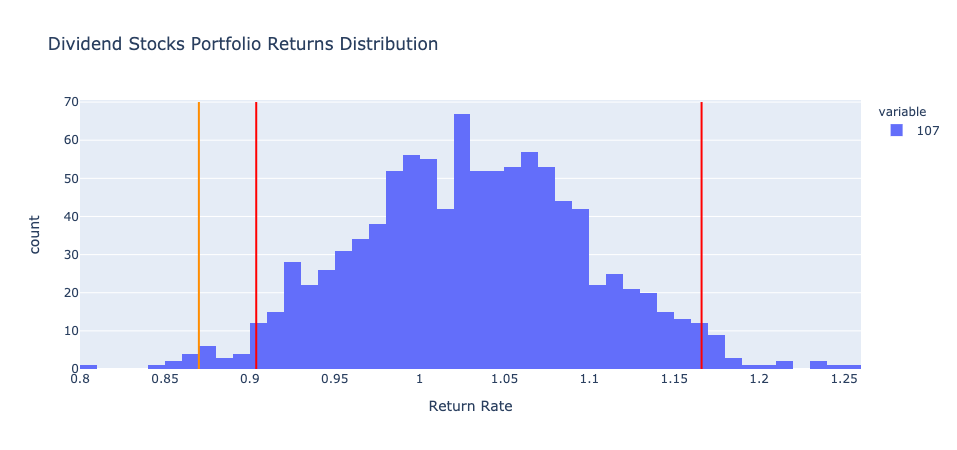

In [83]:
fig.add_shape(
        go.layout.Shape(type='line',
                        x0=div_r_ending,y0=0,x1=div_r_ending, y1=70,line=dict(color="DarkOrange")),
)
fig.add_shape(
        go.layout.Shape(type='line',
                        x0=div_confidence_interval.iloc[0],y0=0,x1=div_confidence_interval.iloc[0], y1=70,line=dict(color="Red")),
)
fig.add_shape(
        go.layout.Shape(type='line',
                        x0=div_confidence_interval.iloc[1],y0=0,x1=div_confidence_interval.iloc[1], y1=70,line=dict(color="Red")),
)
fig.show()

In [78]:
div_ending_cumulative_returns.std()

0.05997146503345903

In [79]:
div_ending_cumulative_returns.mean()

1.0273655611889776